# Concrete Defect Detection Project

## Introduction
- **Overview:** The goal of this project is to detect and segment concrete defects like cracks, efflorescence, and popouts using advanced machine learning models.
- **Scope:** Implement and fine-tune a segmentation model (SAM2) for enhanced performance on custom datasets. Visualize and evaluate predictions to ensure accurate defect detection.

---

## Environment Setup
### Install Libraries
- Install necessary Python libraries and dependencies for the project.

```python
!pip install roboflow lightning tbparse segmentation_models_pytorch
!pip install git+https://github.com/facebookresearch/segment-anything-2.git
```

---

## Clone Repository
- Clone the repository containing scripts to easly a fine-tune Segment Anything Model (SAM2) with coco datasets.


In [11]:
!git clone https://github.com/Doronbh7/segment-anything-2-fine-tune.git

In [12]:
import os
import re
import cv2
import json
import torch
import math
import random
import numpy as np
import pandas as pd
from PIL import Image
from roboflow import Roboflow
import matplotlib.pyplot as plt
from tbparse import SummaryReader
from pycocotools.coco import COCO
from kaggle_secrets import UserSecretsClient
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

# Dataset Preparation
## Initialize Roboflow API
- Connect to Roboflow API using your personal API key to fetch the dataset for training and validation.
- Download the dataset in COCO segmentation format and prepare it for model training.

In [13]:
# Initialize Roboflow
rf = Roboflow(UserSecretsClient().get_secret("roboflow api"))
rf_project = rf.workspace("concrete-inspections").project("crack-efflorescence-popout")
rf_version = rf_project.version(4)
rf_dataset = rf_version.download("coco-segmentation")

loading Roboflow workspace...
loading Roboflow project...


# Data Processing
## Process Images and Annotations
- Process the dataset annotations and prepare images for prediction using the SAM2 model.

In [14]:
# Process annotations and images
def process_images(data_dir):
    structured_annotations = {}
    for sub_dir in os.listdir(data_dir):
        current_path = os.path.join(data_dir, sub_dir)
        if os.path.isdir(current_path):
            predict_dir = os.path.join(base_predict_dir,sub_dir)
            # Create output directory if not exists
            os.makedirs(predict_dir, exist_ok=True)
            
            # Initialize annotations for this subdirectory
            structured_annotations[sub_dir] = []
            
            # Load COCO annotations
            coco = COCO(os.path.join(current_path,"_annotations.coco.json"))
            
            for image_info in coco.loadImgs(coco.getImgIds()):
                image_id = image_info["id"]
                image_filename = image_info["file_name"]
                image_short_name = image_info["extra"]["name"].split(".")[0]
                image_path = os.path.join(current_path, image_filename)
                image = cv2.imread(image_path)
                
                if image is None:
                    print(f"Skipping {image_filename}, unable to load.")
                    continue
                    
                # Save the original image
                original_image_path = os.path.join(predict_dir, f"{image_short_name}_original.jpg")
                cv2.imwrite(original_image_path, image)
                
                # Set the image for prediction
                predictor.set_image(image)
                
                gt_masks = []
                pred_masks = []
                best_scores = []
                labels = []
                boxes = []
                image_annotations = []
                anns = coco.loadAnns(coco.getAnnIds(imgIds=[image_id]))
            
                for ann in anns:
                    polygon = np.array(ann["segmentation"][0], dtype=np.float32).reshape(-1,2)
                    x,y,w,h = ann["bbox"]
                    box = np.array([x,y,x+w,y+h], dtype=np.float32)
                    boxes.append(ann["bbox"])
                    gt_masks.append(coco.annToMask(ann))
                    label = coco.loadCats(ann["category_id"])[0]['name']
                    labels.append(label)
                
                    # Predict masks using the SAM2 model
                    with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
                        masks, scores,_ = predictor.predict(
                            box=box,
                            point_coords=polygon,  # Use polygon as input points
                            point_labels=np.ones(len(polygon), dtype=np.int32),  # Labels: 1 for foreground
                        )
                        
                    # Select the best mask based on score
                    best_mask_idx = np.argmax(scores)  # Get the index of the mask with the highest score
                    best_mask = masks[best_mask_idx]
                    best_score = scores[best_mask_idx]
                    pred_masks.append(best_mask)
                    best_scores.append(best_score)
                    
                    # Save the individual mask
                    mask_path = os.path.join(predict_dir, f"{image_short_name}_mask_{ann['id']}.png")
                    cv2.imwrite(mask_path, best_mask)
                    
                    # Append annotation details
                    image_annotations.append({
                        "mask": mask_path,
                        "label": label,
                        "score": str(best_score)
                    })
                
                comparsion_path = save_comparsion(np.array(image), np.array(pred_masks), best_scores, np.array(gt_masks), 
                                                  labels, boxes, image_short_name, predict_dir)
                # Save all annotations for this image
                structured_annotations[sub_dir].append({
                    "original_image": original_image_path,
                    "comparsion": comparsion_path,
                    "annotations": image_annotations,
                })
                
    # Save the structured annotations JSON
    with open(os.path.join(base_predict_dir,"structured_annotations.json"), "w") as f:
        json.dump(structured_annotations, f, indent=4)

    print("All images processed and saved!")

# Visualization and Comparison
## Generate Comparison Images
- Generate visual comparisons between original images, predicted masks, and ground truth annotations.

In [38]:
def save_comparsion(image, pred_masks, scores, gt_masks, labels, boxes, name, path):
    """
    Visualize and save a comparison of the original image, predicted masks with semantic labels and scores, 
    and ground truth masks.

    Args:
        image (ndarray): The original image to be visualized.
        pred_masks (list): A list of predicted masks generated by a model.
        scores (list): A list of confidence scores for the predicted masks.
        gt_masks (list): A list of ground truth masks from the dataset.
        labels (list): A list of semantic labels corresponding to the predicted masks.
        boxes (list): A list of bounding boxes (in XYWH format) for the predicted masks.
        name (str): A unique name for saving the comparison image.
        path (str): The directory path where the comparison image will be saved.

    Returns:
        str: The full path to the saved comparison image.
    """
    
    comparsion_path = os.path.join(path, f"{name}_comparsion.png")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Original Image
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    pred_overlay = image.copy()
    gt_overlay = image.copy()
    
    # Masks with Semantic Labels and Scores
    for index, (prd_mask, score, gt_mask, label, box) in enumerate(zip(pred_masks, scores, gt_masks, labels, boxes)):
        color = plt.get_cmap('tab10')(index % 10)
        x, y, w, h = box
        pred_overlay[prd_mask > 0.5] = (1 - 0.5) * pred_overlay[prd_mask > 0.5] + 0.5 * np.array(color[:3])
        gt_overlay[gt_mask > 0.5] = (1 - 0.5) * gt_overlay[gt_mask > 0.5] + 0.5 * np.array(color[:3])
        axes[1].text(x, y, f"{label}\n{score:.2f}", color='white', fontsize=12, backgroundcolor='black')
        axes[1].add_patch(plt.Rectangle((x, y), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

    axes[1].imshow(pred_overlay)
    axes[1].set_title("Masks with Labels & Scores")
    axes[1].axis('off')
    
    # Ground Truths
    axes[2].imshow(gt_overlay)
    axes[2].set_title("Ground Truths")
    axes[2].axis('off')
    
    # Save the figure
    plt.savefig(comparsion_path)
    plt.close(fig)
    
    return comparsion_path

In [16]:
def get_best_checkpoint(checkpoint_dir, metric="f1"):
    """
    Automatically selects the best fine-tuned checkpoint based on the metric value.

    Args:
        checkpoint_dir (str): Path to the directory containing checkpoint files.
        metric (str): The metric to use for selecting the best checkpoint (default is "f1").

    Returns:
        str: Path to the best checkpoint file, or None if no valid checkpoints are found.
    """
    best_checkpoint = None
    best_metric_value = float('-inf')

    # Regex pattern to extract the metric value from the filename
    pattern = re.compile(rf"epoch-\d+-{metric}([\d.]+)-ckpt\.pth")

    # Traverse all files in the directory
    for filename in os.listdir(checkpoint_dir):
        match = pattern.search(filename)
        if match:
            # Extract the metric value
            metric_value = float(match.group(1))
            # Update the best checkpoint if the current one is better
            if metric_value > best_metric_value:
                best_metric_value = metric_value
                best_checkpoint = os.path.join(checkpoint_dir, filename)

    return best_checkpoint

In [17]:
def smooth(scalars: list[float], weight: float) -> list[float]:
    """
    EMA implementation according to
    https://github.com/tensorflow/tensorboard/blob/34877f15153e1a2087316b9952c931807a122aa7/tensorboard/components/vz_line_chart2/line-chart.ts#L699
    """
    last = 0
    smoothed = []
    num_acc = 0
    for next_val in scalars:
        last = last * weight + (1 - weight) * next_val
        num_acc += 1
        # de-bias
        debias_weight = 1
        if weight != 1:
            debias_weight = 1 - math.pow(weight, num_acc)
        smoothed_val = last / debias_weight
        smoothed.append(smoothed_val)

    return smoothed

# Model Setup and Fine-Tuning
## Define Model Paths
- Set up paths for model files, checkpoints, and output directories.

In [18]:
base_model_path = os.path.join("//kaggle/input","segment-anything-2.1/pytorch/sam2.1-hiera-base-plus/1")
base_checkpoint_path = f"""{os.path.join(base_model_path, "sam2.1_hiera_base_plus.pt")}"""
base_model_cfg = f"""{os.path.join(base_model_path, "sam2.1_hiera_b.yaml")}"""
base_predict_dir = "/kaggle/working/predict"
out_checkpoint_dir = "/kaggle/working/training"
img_embeddings_dir = "/kaggle/working/img_embeddings"
segmentated_val_imgs_dir = "/kaggle/working/segmentated_val_imgs"
for path in [img_embeddings_dir, segmentated_val_imgs_dir]:
    os.makedirs(path, exist_ok=True)

dataset = {"image_resize": 256}
for split in ['train','valid']:
    if split == 'valid':
        key = 'val'
    else:
        key = split
    dataset[key] = {
        'root_dir': f"""{os.path.join(rf_dataset.location,split)}""",
        'annotation_file': f"""{os.path.join(rf_dataset.location,split,"_annotations.coco.json")}"""
    }    

## Configure Training Parameters
- Dynamically update the configuration file with paths and parameters.

In [44]:
config_update = {
    "num_devices": 1,
    "num_epochs": 10,
    "out_checkpoint_dir": out_checkpoint_dir,
    "save_validation_images_result": True,
    "segmentated_validation_images_dir": segmentated_val_imgs_dir,
    "image_features_embeddings_dir": img_embeddings_dir,
    "model.type": base_model_cfg,
    "model.base_model_checkpoint": base_checkpoint_path,
    "dataset": dataset
}

In [21]:
os.chdir('/kaggle/working/segment-anything-2-fine-tune/SAM_V2_Finetune')

In [22]:
# Read the existing config.py file
with open('config.py', 'r') as file:
    lines = file.readlines()

# Update the file dynamically based on Config_update
updated_lines = []
for line in lines:
    for key, value in config_update.items():
        if key in line:
            # Handle dictionary values explicitly
            if isinstance(value, dict):
                line = f'    "{key}": {value},\n'
            # Handle strings
            elif isinstance(value, str):
                line = f'    "{key}": "{value}",\n'
            # Handle integers, booleans, etc.
            elif isinstance(value, (int, bool)):
                line = f'    "{key}": {value},\n'
    updated_lines.append(line)

# Save the updated config.py
with open('config.py', 'w') as file:
    file.writelines(updated_lines)

In [23]:
!cat config.py


from box import Box

config = {
    "num_devices": 1,
    "num_workers": 4,
    "num_epochs": 40,
    "eval_interval": 3,
    "out_checkpoint_dir": "/kaggle/working/training",
    "save_validation_images_result": True,
    "segmentated_validation_images_dir": "/kaggle/working/segmentated_val_imgs",
    "prompt_type":"points", #points/bounding_box
    "save_image_embeddings":True,
    "save_embeddings_only_for_iterative_sampling": True,  # Temporarily save image embeddings only during the correction clicks loop. Useful for low storage.
    "image_features_embeddings_dir": "/kaggle/working/img_embeddings",
    "iterative_sampling":True,
    "correction_clicks":7,#(only for iterative sampling=True)
    "opt": {
        "learning_rate": 5e-4,
        "weight_decay": 1e-4,
        "decay_factor": 10,
        "steps": [60000, 86666],
        "warmup_steps": 250,
    },
    "model": {
        "type": "//kaggle/input/segment-anything-2.1/pytorch/sam2.1-hiera-base-plus/1/sam2.1_hiera_b.yaml", 

# Training
## Train the Model
- Train the SAM2 model on the concrete defect dataset. Use metrics like Dice loss and Focal loss to evaluate training performance.

In [ ]:
!python train.py

## Visualize Loss Metrics
- Plot training metrics to monitor progress and evaluate the model's performance.

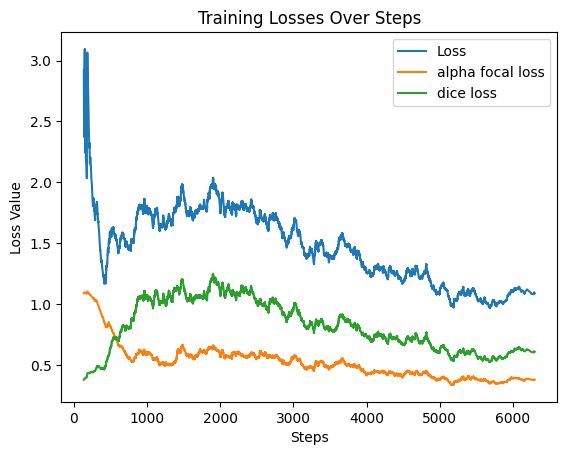

In [19]:
# Path to TensorBoard logs
log_dir = os.path.join(out_checkpoint_dir,"lightning-sam")

# Load logs
reader = SummaryReader(log_dir,extra_columns={'dir_name'})
df = reader.scalars

df['smoothed_value'] = smooth(df['value'],0.999)

df = df[df['dir_name'] == 'version_0']
Loss = df[df['tag']=='Loss']
alpha_focal_loss = df[df['tag'] == 'alpha focal loss']
dice_loss = df[df['tag'] == 'dice loss']
plt.plot(Loss['step'],Loss['smoothed_value'])
plt.plot(alpha_focal_loss['step'],alpha_focal_loss['smoothed_value'])
plt.plot(dice_loss['step'],dice_loss['smoothed_value'])
plt.xlabel('Steps')
plt.ylabel('Loss Value')
plt.legend(['Loss','alpha focal loss','dice loss'])
plt.title('Training Losses Over Steps')
plt.show()

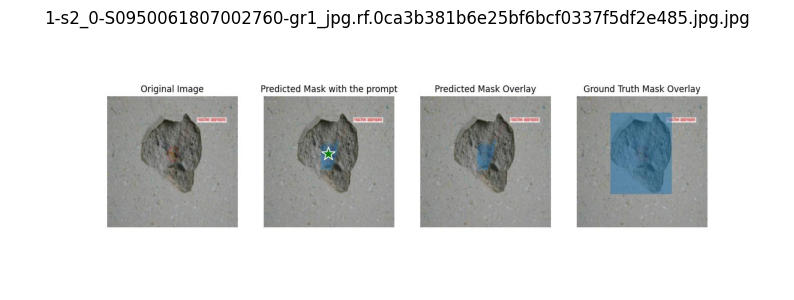

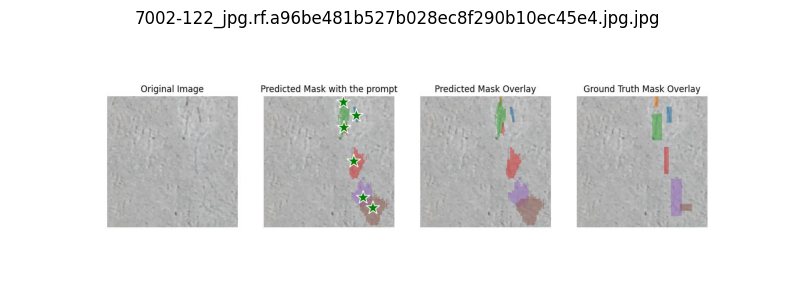

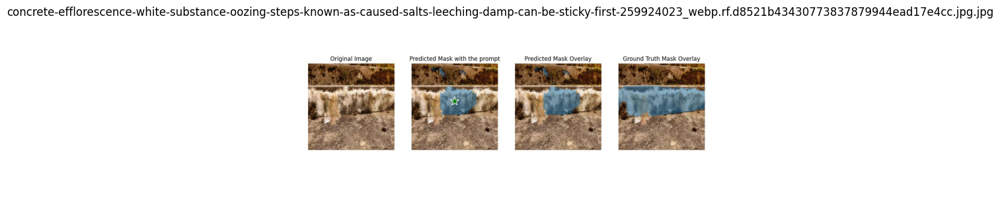

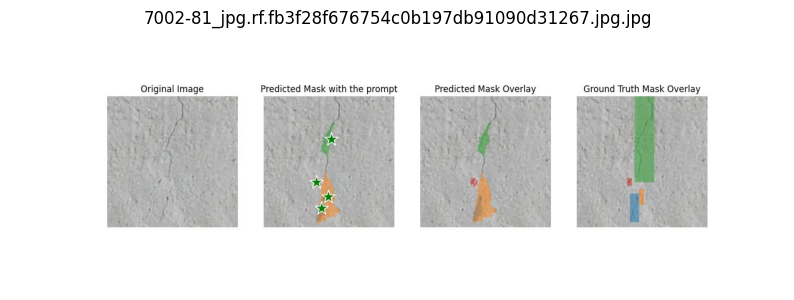

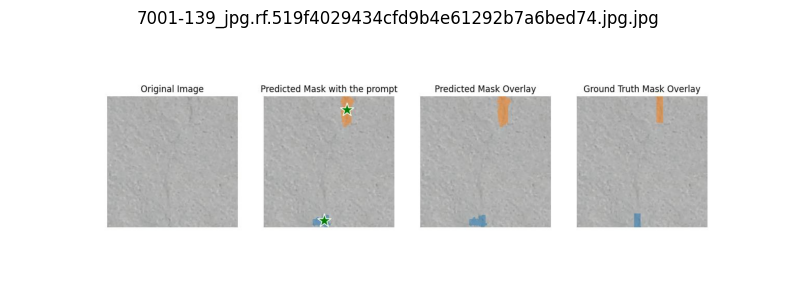

...

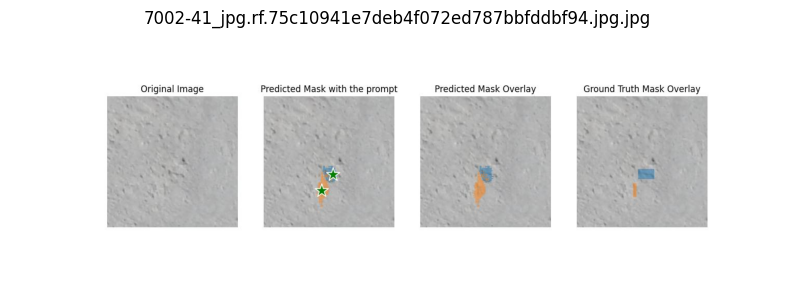

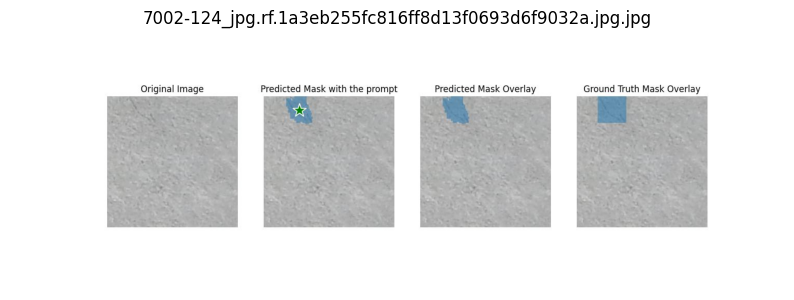

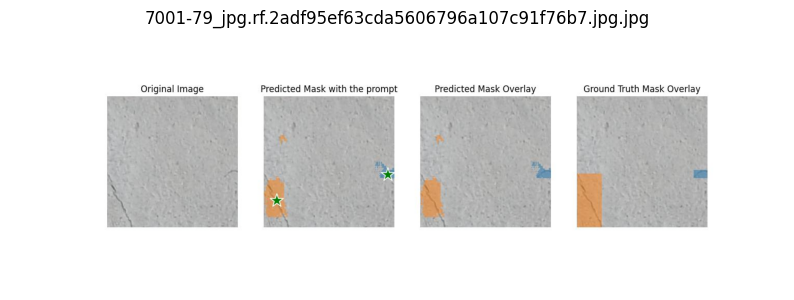

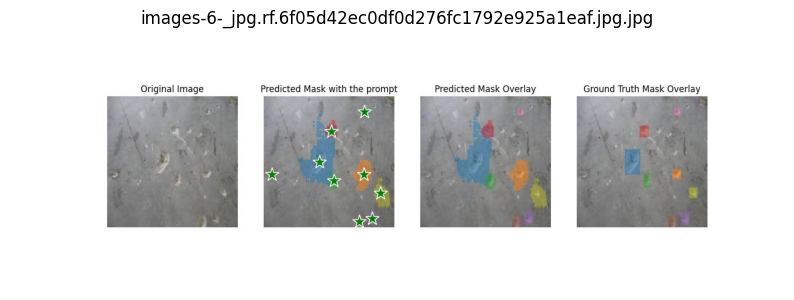

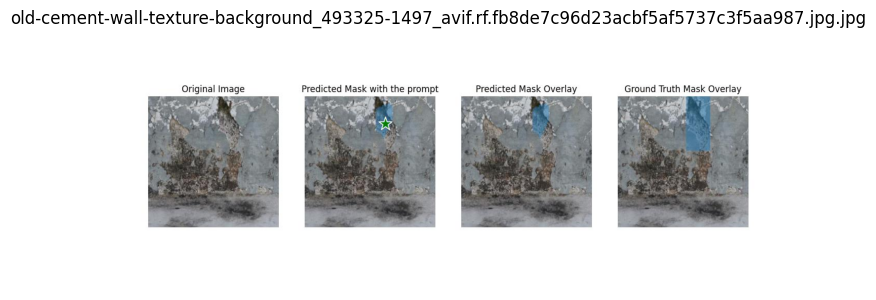

In [20]:
# List all saved images
images = [os.path.join(segmentated_val_imgs_dir, f) for f in os.listdir(segmentated_val_imgs_dir) if f.endswith(".jpg")]

# Display images in the notebook
for img_path in images:
    img = Image.open(img_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(os.path.basename(img_path))
    plt.show()

# Evaluation and Prediction
## Load Fine-Tuned Model
- Load the best checkpoint of the fine-tuned model and use it for predictions.


In [21]:
# Path to the saved checkpoint
finetuned_checkpoint = get_best_checkpoint(out_checkpoint_dir)

model = build_sam2(base_model_cfg,base_checkpoint_path)
model.load_state_dict(torch.load(finetuned_checkpoint, weights_only=True))
predictor = SAM2ImagePredictor(model)

model.eval()

SAM2Base(
  (image_encoder): ImageEncoder(
    (trunk): Hiera(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 112, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      )
      (blocks): ModuleList(
        (0-1): 2 x MultiScaleBlock(
          (norm1): LayerNorm((112,), eps=1e-06, elementwise_affine=True)
          (attn): MultiScaleAttention(
            (qkv): Linear(in_features=112, out_features=336, bias=True)
            (proj): Linear(in_features=112, out_features=112, bias=True)
          )
          (drop_path): Identity()
          (norm2): LayerNorm((112,), eps=1e-06, elementwise_affine=True)
          (mlp): MLP(
            (layers): ModuleList(
              (0): Linear(in_features=112, out_features=448, bias=True)
              (1): Linear(in_features=448, out_features=112, bias=True)
            )
            (act): GELU(approximate='none')
          )
        )
        (2): MultiScaleBlock(
          (norm1): LayerNorm((112,), eps=1e-06, elementwise_affi

## Predict on Test Data
- Use the fine-tuned model to segment defects in test images and generate structured annotations.

In [39]:
process_images(rf_dataset.location)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
All images processed and saved!


## Visualize Predictions
- Display saved comparison images for test data predictions.

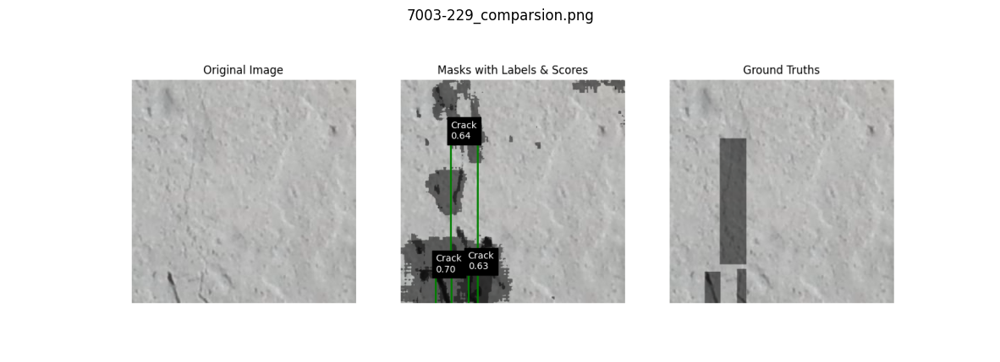

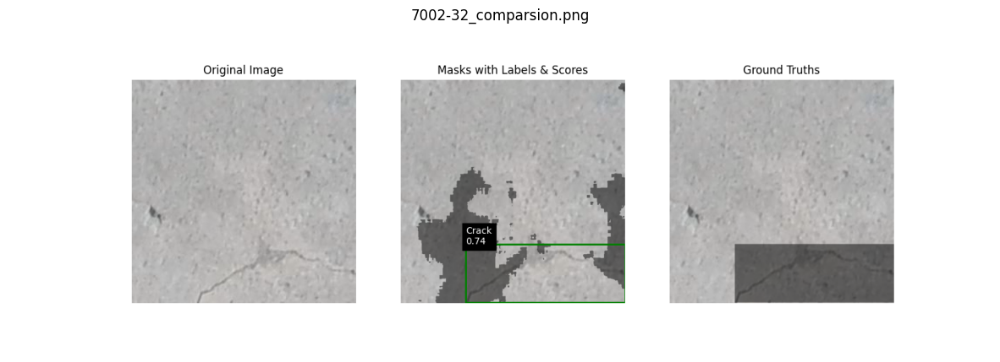

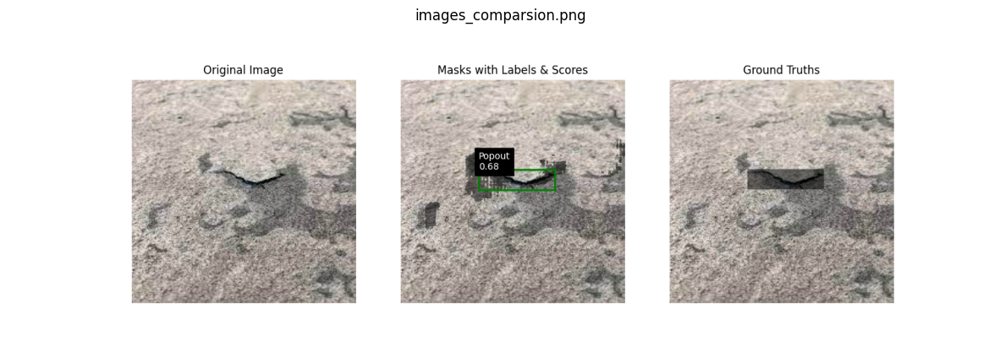

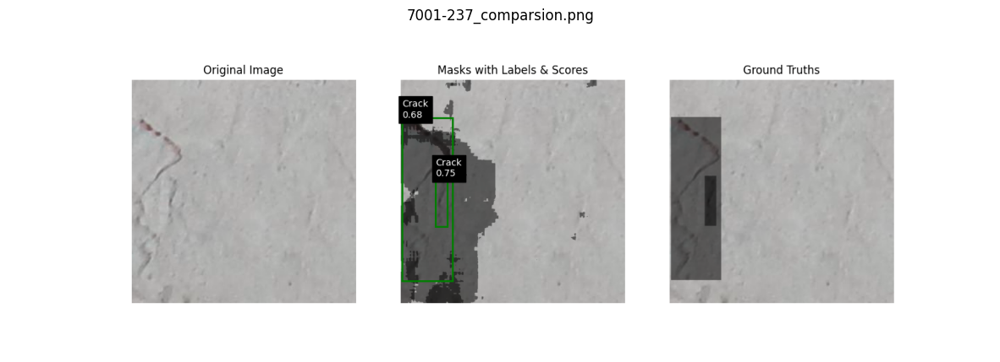

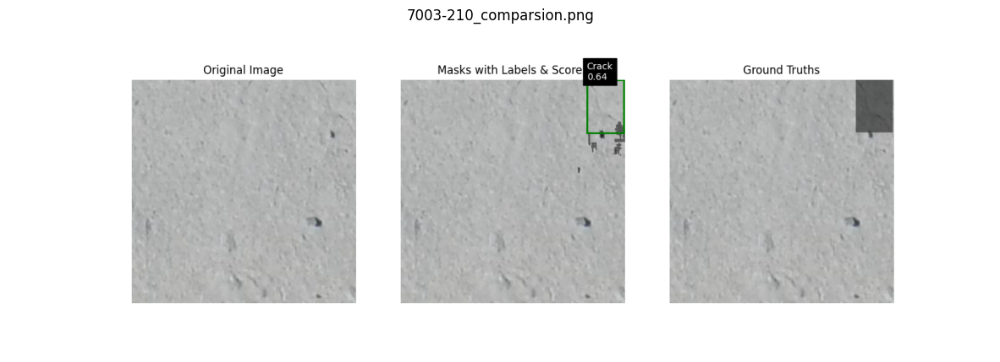

...

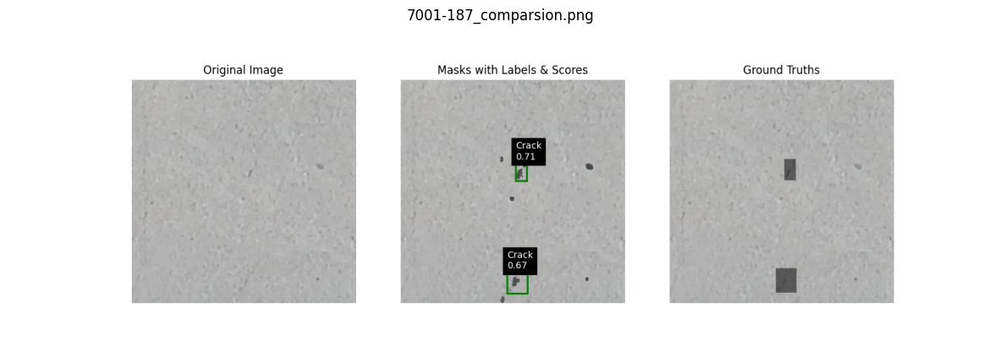

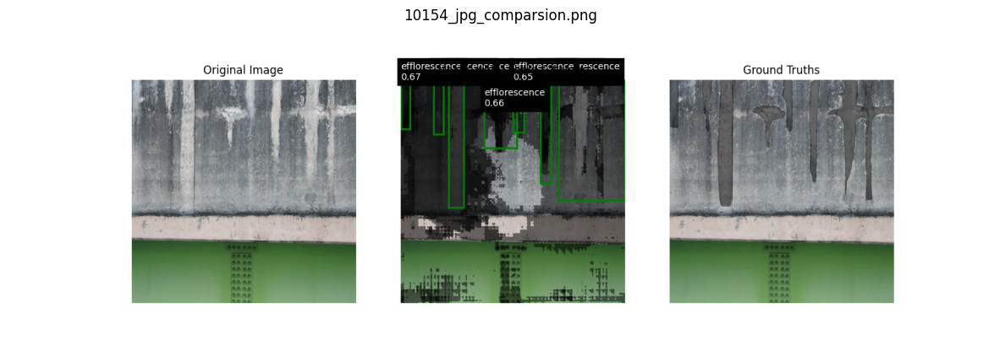

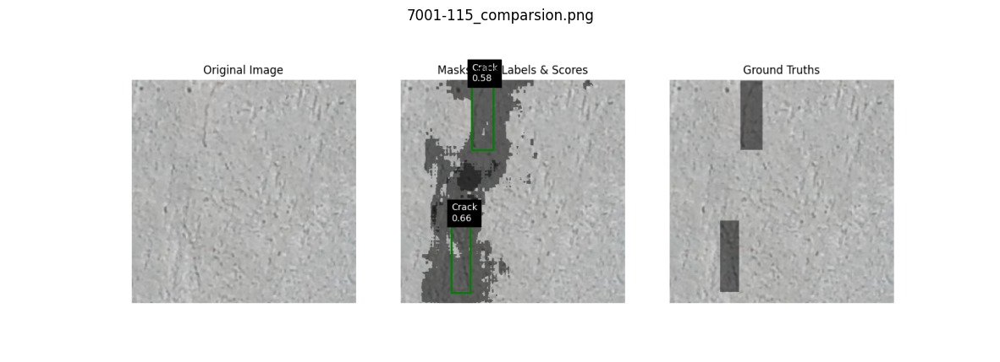

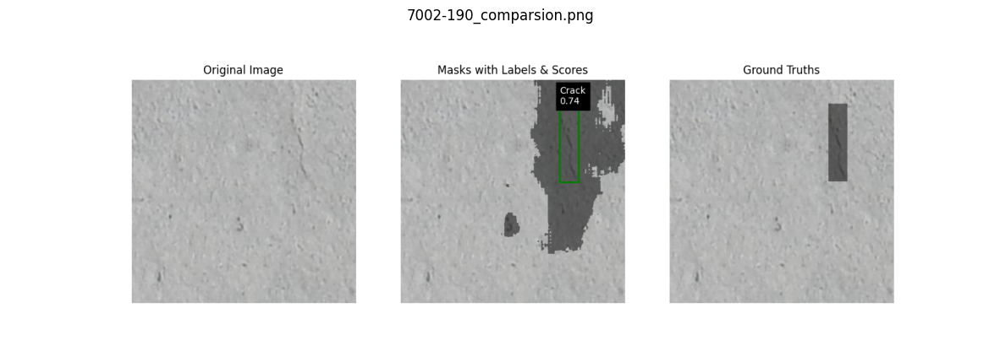

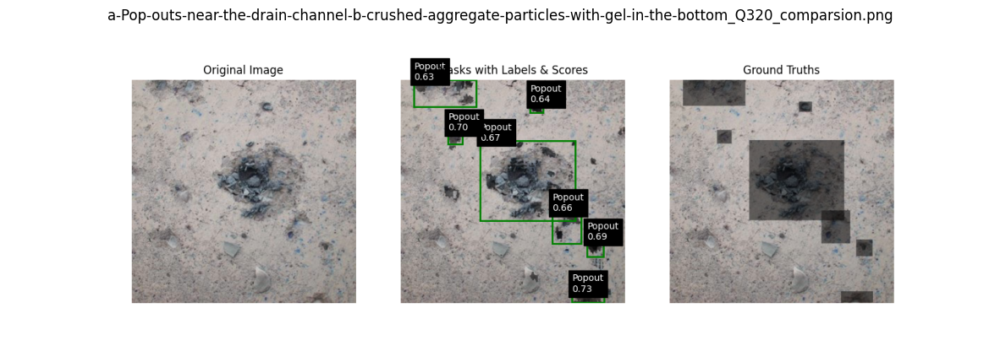

In [43]:
with open(os.path.join(base_predict_dir,'structured_annotations.json'),'r') as f:
    annotations = json.load(f)

# List all saved images
images = [ann['comparsion'] for ann in annotations['test']]

# Display images in the notebook
for image_path in images:
    img = Image.open(image_path)
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.axis('off')
    plt.title(os.path.basename(image_path))
    plt.show()